<a href="https://colab.research.google.com/github/tnewtont/Detecting_Palm_Oil_Plantations_Neural_Networks/blob/main/WiDS_Project_preparation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# !unzip /content/train_images.zip

In [4]:
# !unzip /content/leaderboard_holdout_data.zip

# **Preliminary Preparation / Exploratory Data Analysis**

In [5]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageFilter, ImageEnhance
import json
import pickle
import io, os
import gzip
from google.colab import files
from tensorflow.keras import datasets, layers, models
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import VGG16
from sklearn.metrics import roc_auc_score
import tensorflow as tf
import random
from sklearn.metrics import confusion_matrix, classification_report, precision_score
from sklearn.metrics import recall_score, f1_score, precision_recall_curve, average_precision_score, auc, roc_curve
import seaborn as sns
from keras import regularizers
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout, GaussianNoise, RandomFlip, RandomZoom, RandomRotation, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import HeNormal
import tensorflow.keras.backend
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [6]:
# Function that takes a given subset of the dataframe and plots a 5x3 grid of the images

def plot_img_grid(subset_df, img_directory):
  fig, axes = plt.subplots(5, 3, figsize = (10,10))

  for i, ax in enumerate(axes.flatten()):
    if i < len(subset_df):
      row = subset_df.iloc[i]
      img_path = os.path.join(img_directory, row['image_id'])
      label = row['has_oilpalm']
      score = row['score']

      try:
        img = mpimg.imread(img_path)
        ax.imshow(img)
        ax.set_title(f"Label: {label}, Score: {score:.2f}", fontsize=8)
      except FileNotFoundError:
        ax.test(0.5, 0.5, "Image Not Found", ha = "center", va = "center", fontsize = 8)
        ax.set_title(f"{row['filename']}", fontsize=8)
    ax.axis('off')

  plt.tight_layout()
  plt.show()

In [7]:
# Function that takes a sample positive-class image and shows its transformations
def visualize_transformations(image, label, transformations):
    """
    Display the original image alongside transformed versions.

    Args:
        image: The input image (tensor or NumPy array).
        label: The label (optional, not used in this function).
        transformations: A list of transformation functions.
    """
    # Ensure image is in NumPy format
    if tf.is_tensor(image):
        image = image.numpy()

    # Create a figure for visualization
    n = len(transformations) + 1  # Number of transformations + 1 (original image)
    plt.figure(figsize=(13, 13))

    # Plot the original image
    plt.subplot(1, n, 1)
    plt.imshow(image / 255.0)  # Normalize for display if image is in [0, 255]
    plt.title("Original")
    plt.axis("off")

    # Apply transformations and plot
    for i, transform in enumerate(transformations, start=2):
        transformed_image, _ = transform(image, label)
        transformed_image = tf.clip_by_value(transformed_image, 0, 255)  # Ensure valid pixel range
        plt.subplot(1, n, i)
        plt.imshow(transformed_image.numpy() / 255.0)  # Normalize for display
        plt.title(transform.__name__)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Before we read `trainlabels.csv`, let us save the path to the training images.

In [8]:
img_dir = r'/content/train_images'

Now we load `trainlabels.csv` and check for any nulls.




In [9]:
df = pd.read_csv('/content/traininglabels.csv')
df

,image_id,has_oilpalm,score
0,img_000002017.jpg,0,0.7895
1,img_000012017.jpg,0,1.0000
2,img_000022017.jpg,0,1.0000
3,img_000072017.jpg,0,1.0000
4,img_000082017.jpg,0,1.0000
...,...,...,...
15239,img_112602018.jpg,0,0.6093
15240,img_112612018.jpg,0,1.0000
15241,img_112622018.jpg,0,1.0000
15242,img_112632018.jpg,0,1.0000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15244 entries, 0 to 15243
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image_id     15244 non-null  object 
 1   has_oilpalm  15244 non-null  int64  
 2   score        15244 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 357.4+ KB


The dataset contains no nulls, so we do not need to impute.

There are three features:<h>
1. `image_id`, which indicates the filename of the image<h>
2. `has_oilpalm`, the corresponding label where 0 indicates no palm oil plantation, and 1 indicates the pressence of a palm oil plantation (i.e. negative-class and positive-class images, respectively)<h>
3. `score`, a confidence score that indicates the likelihood of the corresponding label being true

We now confirm the image filenames in the training images folder.

In [11]:
fileList = os.listdir(img_dir)
fileList[0:10] # First 10 filenames

['img_06281.jpg',
 'img_06715.jpg',
 'img_02416.jpg',
 'img_02549.jpg',
 'img_03111.jpg',
 'img_10172.jpg',
 'img_03001.jpg',
 'img_10748.jpg',
 'img_09112.jpg',
 'img_07735.jpg']

There's a mismatch between the actual filenames and those listed in the annotations. In this case, the ones listed in the annotations have 2017 and 2018 appended to the name, so we will need to rename these file names.

In [12]:
df['image_id'] = df['image_id'].str.replace('2017', '', regex=False)
df['image_id'] = df['image_id'].str.replace('2018', '', regex=False)

Another thing to check is the number of files listed in the annotations versus the ones in the training images folder.

In [13]:
len(df['image_id'])

15244

In [14]:
len(fileList)

11001

After looking through the original source of the dataset, there were additional images that were added after the end of the competition but were not officially documented. Therefore, we need to make sure that the image filenames in the annotations matches perfectly with the ones in the folder. We can resolve this by using list comprehension and then subsequently eliminating entries that are not taken into account, plus dropping duplicates.

In [15]:
fileList_annotations = list(df['image_id'])

In [16]:
missing = [item for item in fileList_annotations if item not in fileList]

In [17]:
len(missing)

191

In [18]:
df = df.loc[~df['image_id'].isin(missing)]
df = df.drop_duplicates(subset = 'image_id', keep = 'last')

In [19]:
df

,image_id,has_oilpalm,score
1,img_00001.jpg,0,1.0000
2,img_00002.jpg,0,1.0000
8,img_00013.jpg,0,1.0000
9,img_00014.jpg,0,1.0000
17,img_00025.jpg,0,1.0000
...,...,...,...
15052,img_10994.jpg,0,1.0000
15053,img_10995.jpg,0,1.0000
15054,img_10997.jpg,0,1.0000
15055,img_10998.jpg,0,0.6017


In [20]:
df.to_csv('traininglabels_cleaned.csv', index = False) # Save the cleaned annotations

Let's now investigate the distributions of `has_oilpalm` and `score`.

In [21]:
df['has_oilpalm'].value_counts()

,count
has_oilpalm,
0,9266
1,609


In [22]:
has_oilpalm_counts = df['has_oilpalm'].value_counts().to_list()
has_oilpalm_counts

[9266, 609]

In [23]:
has_oilpalm_counts_total = sum(has_oilpalm_counts)
has_oilpalm_proportions = [h / has_oilpalm_counts_total for h in has_oilpalm_counts]
has_oilpalm_proportions

[0.9383291139240506, 0.061670886075949366]

Text(0.5, 1.0, 'Distribution of has_oilpalm')

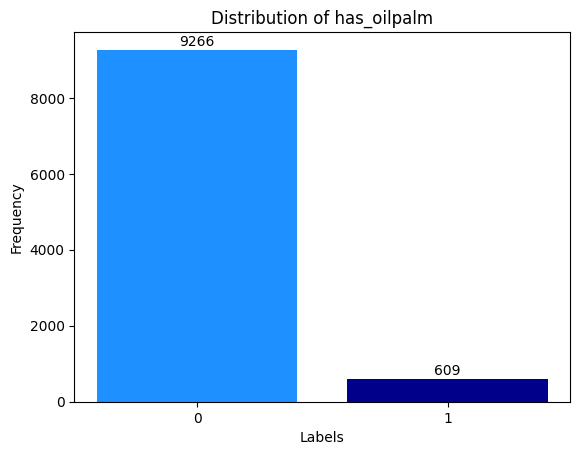

In [24]:
has_oilpalm_labels = [0, 1]
plt.bar(has_oilpalm_labels, has_oilpalm_counts, color = ['dodgerblue', 'darkblue'])
for i, count in enumerate(has_oilpalm_counts):
    plt.text(i, count + 100, str(count), ha='center', fontsize=10)
plt.xlabel('Labels')
plt.xticks([0,1])
plt.ylabel('Frequency')
plt.title('Distribution of has_oilpalm')

The labels are significantly imbalanced.

Let's now observe the distribution of `score` where `has_oilpalm` is 0.

In [25]:
zero_scores = df.query('has_oilpalm == 0')['score'].value_counts().sort_index(ascending = False)
zero_scores.iloc[0]

7671

In [26]:
zero_scores_norm = df.query('has_oilpalm == 0')['score'].value_counts(normalize = True).sort_index(ascending = False)
zero_scores_norm.iloc[0]

0.8278653140513706

We see that the majority, precisely around 82.8%, of the negative-class images have a `score` of 1.

We now want to further investigate these negative-class images, particularly with differing `score` ranges.<h>
1. Score equals 1
2. Score is between 0.7 inclusive and 1 non-inclusive
3. Score is between 0.5 inclusive and 0.7 non-inclusive
4. Score is below 0.5

In [27]:
zero_scores_1 = df.query('has_oilpalm == 0 & score == 1').sample(15)

In [28]:
zero_scores_2 = df.query('has_oilpalm == 0 & ((score >= 0.7) & (score < 1))').sort_values(by = 'score', ascending = False).sample(15)

In [29]:
zero_scores_3 = df.query('has_oilpalm == 0 & ((score >= 0.5) & (score < 0.7))').sort_values(by = 'score', ascending = False).sample(15)

In [30]:
zero_scores_4 = df.query('has_oilpalm == 0 & score < 0.5').sort_values(by = 'score', ascending = False).sample(15)

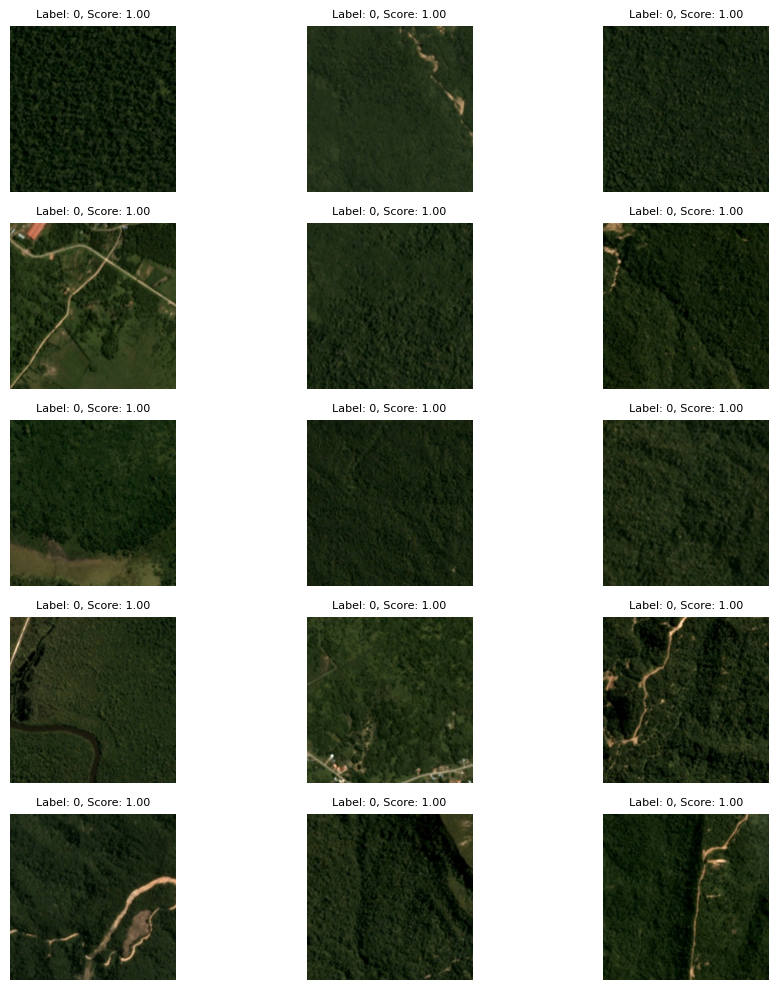

In [ ]:
plot_img_grid(zero_scores_1, img_dir)

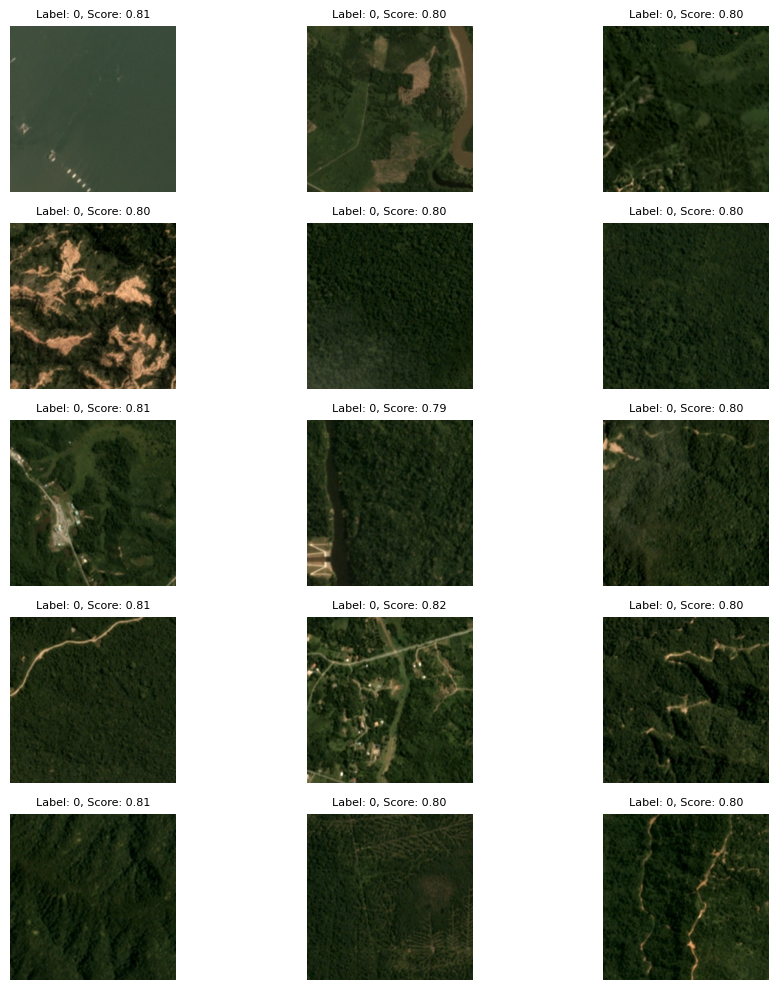

In [ ]:
plot_img_grid(zero_scores_2, img_dir)

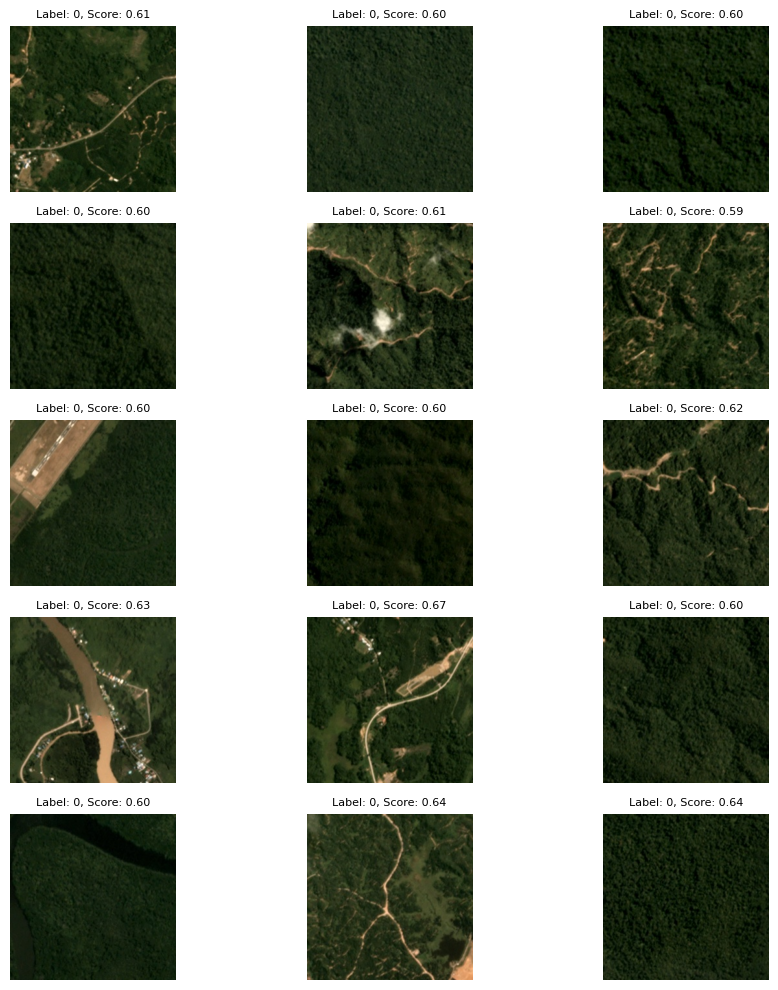

In [ ]:
plot_img_grid(zero_scores_3, img_dir)

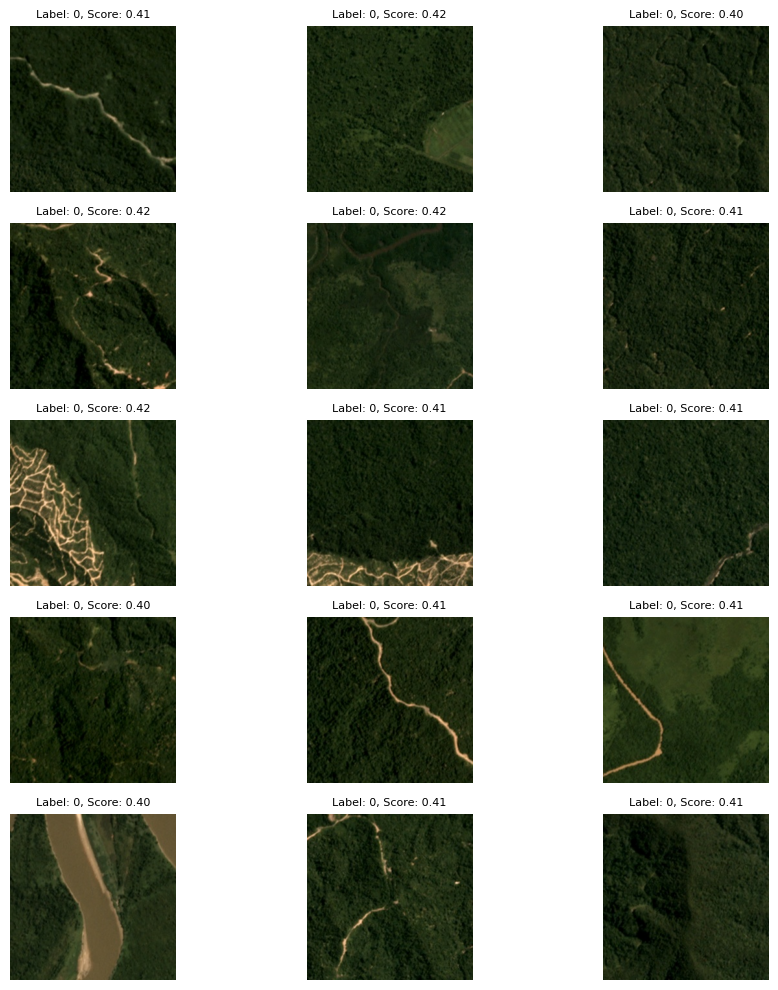

In [ ]:
plot_img_grid(zero_scores_4, img_dir)

In general, we see that there is mostly vegetation and montainous terrain. There are some images that display buildings, paved paths, and what appears to be a nearby water source. Images that display buildings and paved paths do not always indicate the presence of a palm oil plantation, but perhaps a remote settlement or a different type of plantation. However, as the `score` decreases, it becomes less clear about whether or not some of these images absolutely indicate the presence of a palm oil plantation.

Let's now observe the distribution of `score` where `has_oilpalm` is 1.

In [31]:
one_scores = df.query('has_oilpalm == 1')['score'].value_counts().sort_index(ascending = False)
one_scores.iloc[0]

502

In [32]:
one_scores_norm = df.query('has_oilpalm == 1')['score'].value_counts(normalize = True).sort_index(ascending = False)
one_scores_norm.iloc[0]

0.8243021346469622

Like the negative-class images, we see that the majority, precisely around 82.4%, of the positive-class images have a `score` of 1. We now want to further investigate the positive-class images, using the same `score` ranges previously.<h>
1. Score equals 1
2. Score is between 0.7 inclusive and 1 non-inclusive
3. Score is between 0.5 inclusive and 0.7 non-inclusive
4. Score is below 0.5

In [33]:
# Score equals 1
one_scores_1 = df.query('has_oilpalm == 1 & score == 1').sample(15)

In [34]:
# Score is between 0.7 inclusive and 1 non-inclusive
one_scores_2 = df.query('has_oilpalm == 1 & ((score >= 0.7) & (score < 1))').sort_values(by = 'score', ascending = False).sample(15)

In [35]:
# Score is between 0.5 inclusive and 0.7 non-inclusive
one_scores_3 = df.query('has_oilpalm == 1 & ((score >= 0.5) & (score < 0.7))').sort_values(by = 'score', ascending = False).sample(15)

In [36]:
# Score is below 0.5
one_scores_4 = df.query('has_oilpalm == 1 & score < 0.5').sort_values(by = 'score', ascending = False).sample(15)

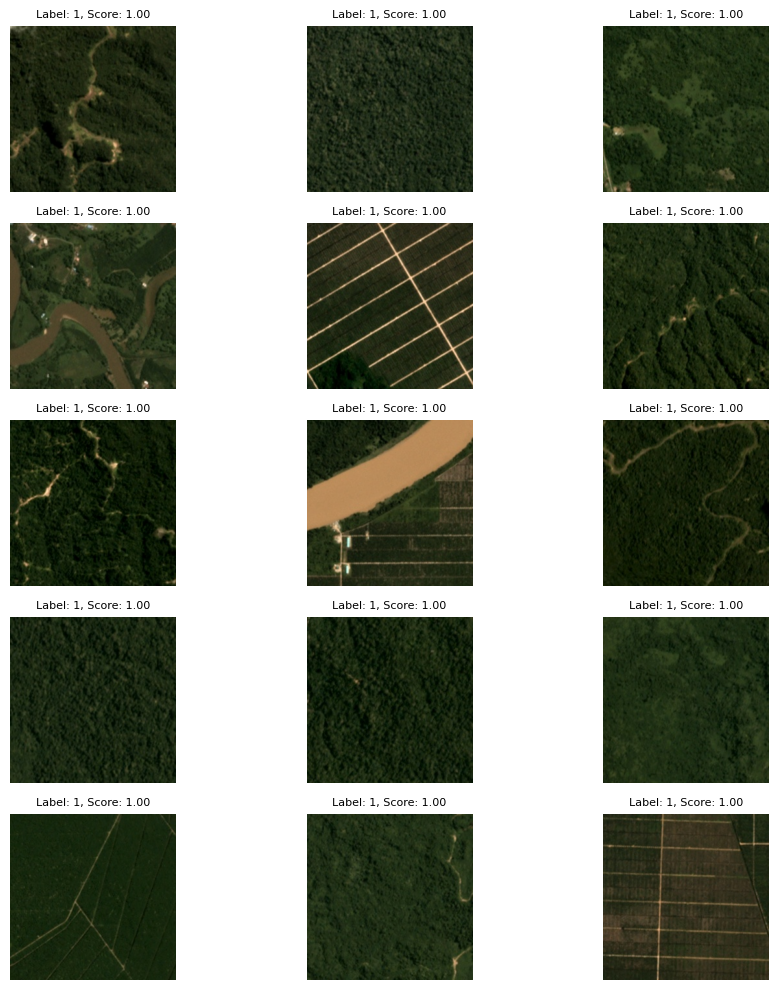

In [ ]:
plot_img_grid(one_scores_1, img_dir)

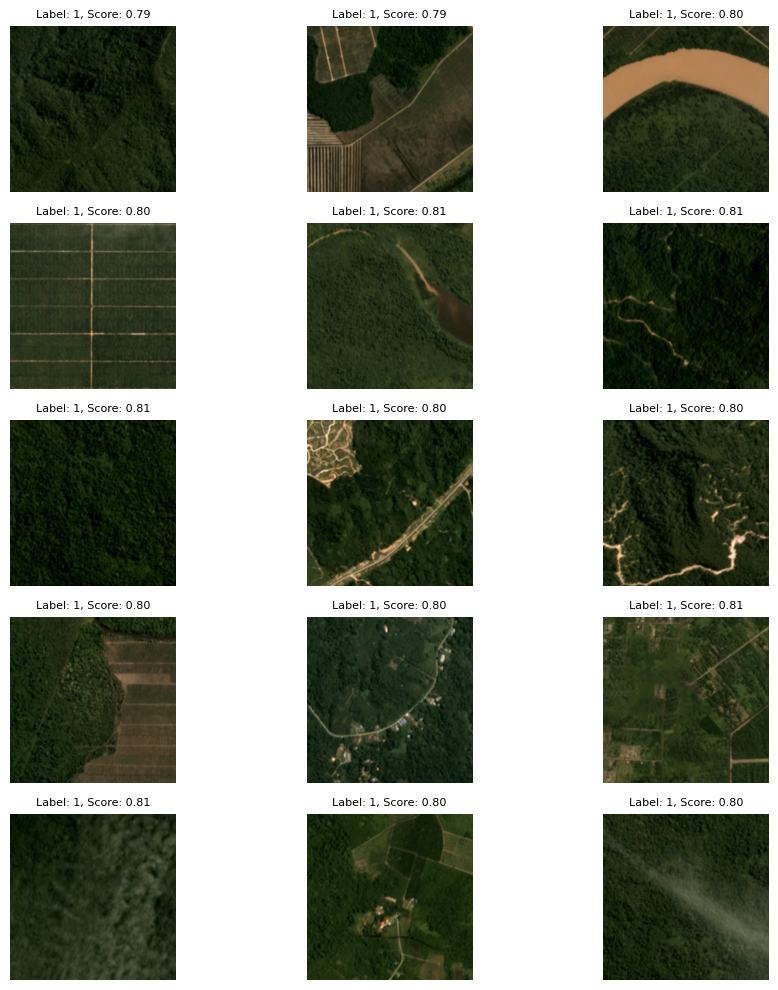

In [ ]:
plot_img_grid(one_scores_2, img_dir)

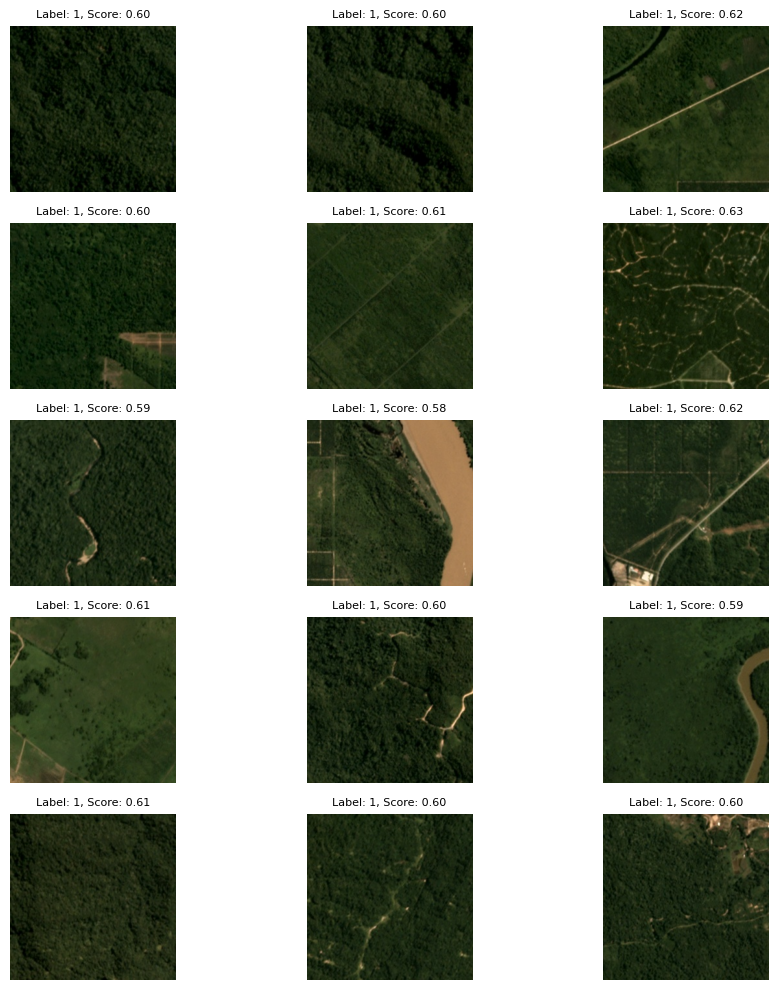

In [ ]:
plot_img_grid(one_scores_3, img_dir)

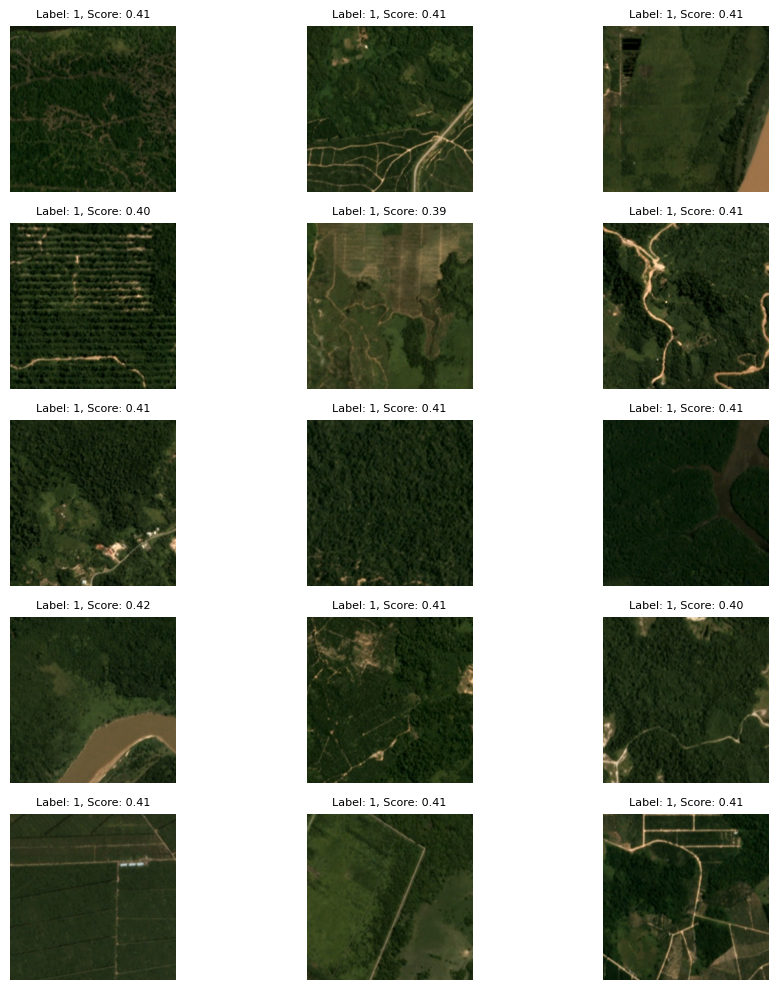

In [ ]:
plot_img_grid(one_scores_4, img_dir)

For the positive-class images, even though some of them appear highly similar to to the negative-class ones, the vegetation is unnatural and is rather palm oil plants. Additionally, some of them indicate heavily-paved paths and rectangular criss-cross grids. However, similar to the negative-class images, as the `score` decreases, it becomes harder to distinguish whether or not there is a palm oil plantation.

# **Data Wrangling**

The most crucial thing to address is the class imbalance, since around 93.8% of the images are negative-class, whereas the remaining 6.2% are positive-class. In this case, setting a threshold for `score` for both classes is critical to our implementation. We will establish these two thresholds:<h>
1. For the negative-class images, set `score` equal to 1.
2. For the positive-class images, set `score` equal or greater than 0.5.

In [37]:
negative_classes = df.loc[(df['has_oilpalm'] == 0) & (df['score'] == 1)]
positive_classes = df.loc[(df['has_oilpalm'] == 1) & (df['score'] > 0.5)]

In [38]:
negative_classes # There are 7671 negative-class images after filtering

,image_id,has_oilpalm,score
1,img_00001.jpg,0,1.0
2,img_00002.jpg,0,1.0
8,img_00013.jpg,0,1.0
9,img_00014.jpg,0,1.0
17,img_00025.jpg,0,1.0
...,...,...,...
15050,img_10989.jpg,0,1.0
15052,img_10994.jpg,0,1.0
15053,img_10995.jpg,0,1.0
15054,img_10997.jpg,0,1.0


In [39]:
positive_classes # There are 593 positive-class images after filtering

,image_id,has_oilpalm,score
109,img_00171.jpg,1,0.7543
129,img_00201.jpg,1,1.0000
155,img_00240.jpg,1,1.0000
203,img_00316.jpg,1,1.0000
271,img_00423.jpg,1,1.0000
...,...,...,...
14961,img_10853.jpg,1,1.0000
15011,img_10929.jpg,1,1.0000
15031,img_10957.jpg,1,1.0000
15048,img_10986.jpg,1,1.0000


We are going to undersample our negative-class images to 5930 since we will also oversample our positive-class images later on when we augment them. In this case, we will make our negative-class images 10 times as large as our positive-class images.

In [40]:
negative_classes_sampled = negative_classes.sample(5930, random_state = 42)

We will then concatenate the negative and positive classes together.

In [41]:
pos_neg_df = pd.concat([negative_classes_sampled, positive_classes])

In order for our model to predict the labels properly, the labels need to be converted to string-type.

In [42]:
pos_neg_df['has_oilpalm'] = pos_neg_df['has_oilpalm'].astype('string')

In [43]:
pos_neg_df

,image_id,has_oilpalm,score
13466,img_08733.jpg,0,1.0
9400,img_02771.jpg,0,1.0
12531,img_07305.jpg,0,1.0
12103,img_06661.jpg,0,1.0
6836,img_10004.jpg,0,1.0
...,...,...,...
14961,img_10853.jpg,1,1.0
15011,img_10929.jpg,1,1.0
15031,img_10957.jpg,1,1.0
15048,img_10986.jpg,1,1.0


In [44]:
# Double checking the proper number of negative and positive class images
print(len(pos_neg_df.loc[pos_neg_df['has_oilpalm'] == '0']))
print(len(pos_neg_df.loc[pos_neg_df['has_oilpalm'] == '1']))
print(len(pos_neg_df.loc[pos_neg_df['has_oilpalm'] == '0']) + len(pos_neg_df.loc[pos_neg_df['has_oilpalm'] == '1']))

5930
593
6523


In [45]:
# Save our filtered annotations
pos_neg_df.to_csv('traininglabels_filtered.csv', index = False)

In [46]:
# Load our recently-saved filtered annotations file
tlf = pd.read_csv('/content/traininglabels_filtered.csv')
tlf

,image_id,has_oilpalm,score
0,img_08733.jpg,0,1.0
1,img_02771.jpg,0,1.0
2,img_07305.jpg,0,1.0
3,img_06661.jpg,0,1.0
4,img_10004.jpg,0,1.0
...,...,...,...
6518,img_10853.jpg,1,1.0
6519,img_10929.jpg,1,1.0
6520,img_10957.jpg,1,1.0
6521,img_10986.jpg,1,1.0


In [47]:
# Obtain all of the paths of the image filenames and their corresponding labels
file_paths = tlf['image_id'].apply(lambda x: f"{img_dir}/{x}").values
labels = tlf['has_oilpalm'].values

We will be utilizing transfer learning via VGG19, which requires the images to be preprocessed in a specific way, mainly through `preprocess_input`.

In [48]:
def load_and_preprocess(image_path, label):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [224, 224])  # Resize to model's input size
    image = tf.cast(image, tf.float32)  # Convert to float32 for preprocessing
    image = preprocess_input(image)  # Apply VGG19-specific preprocessing
    return image, label

In [49]:
dataset = tf.data.Dataset.from_tensor_slices((file_paths, labels))
dataset = dataset.map(load_and_preprocess)

In [50]:
positive_dataset = dataset.filter(lambda _, label: label == 1)
negative_dataset = dataset.filter(lambda _, label: label == 0)

To augment our positive-class images, we will employ 6 types of transformations:<h>
1. Random brightness, applied 2 times
2. Random contrast, applied 2 times
3. Random blur, applied 2 times
4. Rotate by 90 degrees
5. Rotate by 180 degrees
6. Rotate by 270 degrees<h>

The goal is to have a robust set of positive-class images, and these transformations were chosen deliberately as they do not heavily distort important features that our model might not catch. In particular, for random brightness, random contrast, and random blur, we only want to apply a minor effect to the images to retain the original integrity as much as possible.

In [51]:
# Augmenting the positive-class images

def random_brightness(image, label):
    image = tf.image.random_brightness(image, max_delta = 0.5)
    return image, label

def random_contrast(image, label):
    image = tf.image.random_contrast(image, lower = 0.8, upper = 1.2)
    return image, label

# Random blurring
def gaussian_kernel(size: int, sigma: float):
    x = tf.range(-size // 2 + 1, size // 2 + 1, dtype=tf.float32)
    x = tf.exp(-0.5 * (x / sigma) ** 2)
    kernel = tf.tensordot(x, x, axes=0)
    kernel /= tf.reduce_sum(kernel)
    return kernel

def random_blur(image, label):
    kernel_size = tf.random.uniform([], minval=3, maxval=7, dtype=tf.int32)  # Random kernel size
    sigma = tf.random.uniform([], minval=0.5, maxval=2.0)  # Random standard deviation
    kernel = gaussian_kernel(kernel_size, sigma)
    kernel = kernel[:, :, tf.newaxis, tf.newaxis]  # Shape it for convolution
    kernel = tf.tile(kernel, [1, 1, 3, 1])  # Apply to all 3 channels (RGB)

    # Add batch dimension to image for convolution
    image = tf.expand_dims(image, axis=0)
    blurred_image = tf.nn.depthwise_conv2d(image, kernel, strides=[1, 1, 1, 1], padding='SAME')
    blurred_image = tf.squeeze(blurred_image, axis=0)  # Remove batch dimension

    return blurred_image, label

# Rotations
def rotate_90(image, label):
  image = tf.image.rot90(image, k = 1)
  return image, label

def rotate_180(image, label):
  image = tf.image.rot90(image, k = 2)
  return image, label

def rotate_270(image, label):
  image = tf.image.rot90(image, k = 3)
  return image, label

In [52]:
# Take a positive-class image and obtain its path
sample_positive_img = file_paths[-1]

In [53]:
# Example: A sample image tensor
sample_image = tf.image.resize(tf.image.decode_jpeg(tf.io.read_file(sample_positive_img)), [224, 224])
sample_image = tf.cast(sample_image, tf.float32)  # Convert to float32
sample_label = 1  # Corresponding label

# List of transformation functions
transformations = [
    random_brightness,
    random_contrast,
    random_blur,
    rotate_90,
    rotate_180,
    rotate_270,
]

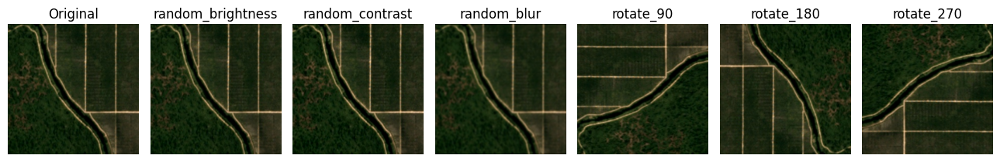

In [54]:
visualize_transformations(sample_image, sample_label, transformations)

In [ ]:
# Apply and repeat augmentations
augmented_brightness = positive_dataset.map(random_brightness).repeat(2)
augmented_contrast = positive_dataset.map(random_contrast).repeat(2)
augmented_blur = positive_dataset.map(random_blur).repeat(2)
augmented_rot90 = positive_dataset.map(rotate_90)
augmented_rot180 = positive_dataset.map(rotate_180)
augmented_rot270 = positive_dataset.map(rotate_270)

# Combine datasets
positive_augmented = positive_dataset.concatenate(augmented_brightness)\
.concatenate(augmented_contrast)\
.concatenate(augmented_blur)\
.concatenate(augmented_rot90)\
.concatenate(augmented_rot180)\
.concatenate(augmented_rot270)

In [ ]:
negative_balanced = negative_dataset

In [ ]:
final_dataset = positive_augmented.concatenate(negative_balanced).shuffle(10000).batch(32)

In [ ]:
images, labels = [], []
for image_batch, label_batch in final_dataset.unbatch():
    images.append(image_batch.numpy())  # Convert image to NumPy
    labels.append(label_batch.numpy())  # Convert label to NumPy

In [ ]:
# Convert lists to NumPy arrays
images = np.array(images)
labels = np.array(labels)

In [ ]:
# Save with gzip compression
with gzip.open('images_labels.pickle.gz', 'wb') as f:
    pickle.dump((images, labels), f)

In [ ]:
with gzip.open('images_labels.pickle.gz', 'rb') as f:
  images_loaded, labels_loaded = pickle.load(f)

In [ ]:
(images == images_loaded).sum()

1785262080

In [ ]:
images.shape

(11860, 224, 224, 3)

In [ ]:
images_loaded.shape

(11860, 224, 224, 3)

In [ ]:
# Checking if the original and pickled version are the same
result = 1
for num in images_loaded.shape:
    result *= num

print(result)

1785262080


In [ ]:
labels.shape

(11860,)

In [ ]:
labels_loaded.shape

(11860,)

In [ ]:
(labels == labels_loaded).sum()

11860

# **Preparing the Holdout Dataset**

Our holdout dataset, which is contained under `leaderboard_holdout_data.zip` and its corresponding annotations file `holdout.csv`, will be used to evaluate the performance of our model. We will do the same as above and same the corresponding images and labels as arrays and pickle them.

In [ ]:
ho = pd.read_csv('/content/holdout.csv')
ho

,image_id,has_oilpalm,score
0,img_050982017.jpg,1,1.0000
1,img_101882017.jpg,1,1.0000
2,img_109452017.jpg,1,0.8079
3,img_009842017.jpg,1,1.0000
4,img_083672017.jpg,1,1.0000
...,...,...,...
2173,img_012452018.jpg,0,1.0000
2174,img_078482018.jpg,0,1.0000
2175,img_074352018.jpg,0,1.0000
2176,img_087262018.jpg,0,1.0000


We will plot out a sample of images for both classes from the holdout dataset.

In [ ]:
ho_dir = '/content/leaderboard_holdout_data'

In [ ]:
ho_positives = ho.query('has_oilpalm == 1').sample(15)
ho_negatives = ho.query('has_oilpalm == 0').sample(15)

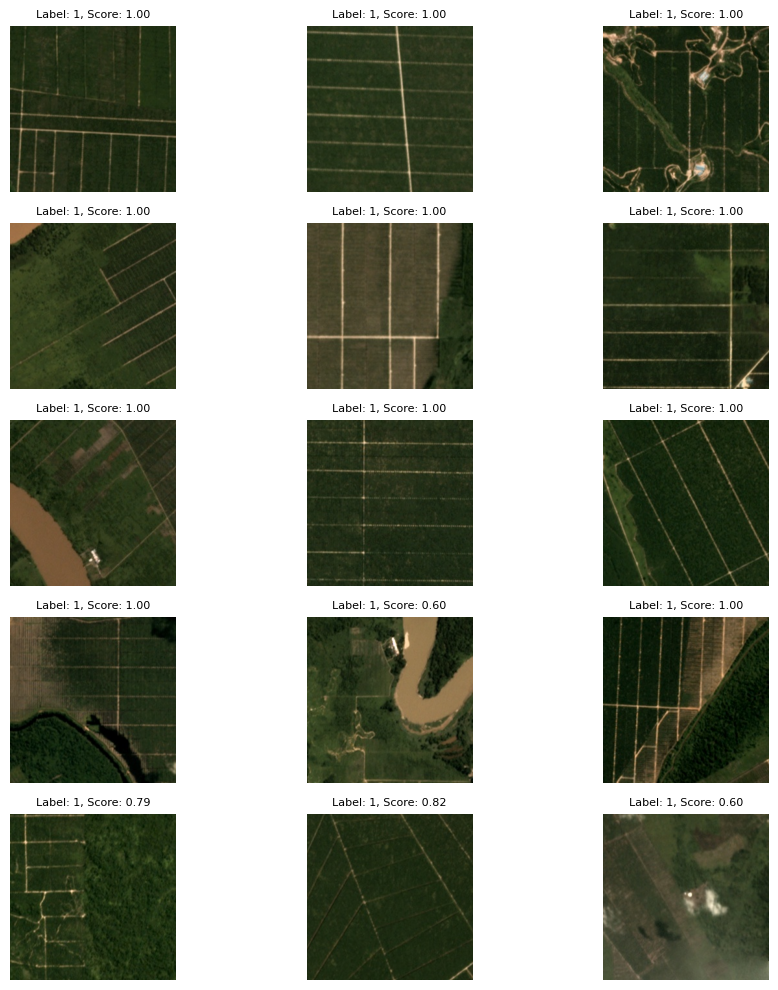

In [ ]:
plot_img_grid(ho_positives, ho_dir)

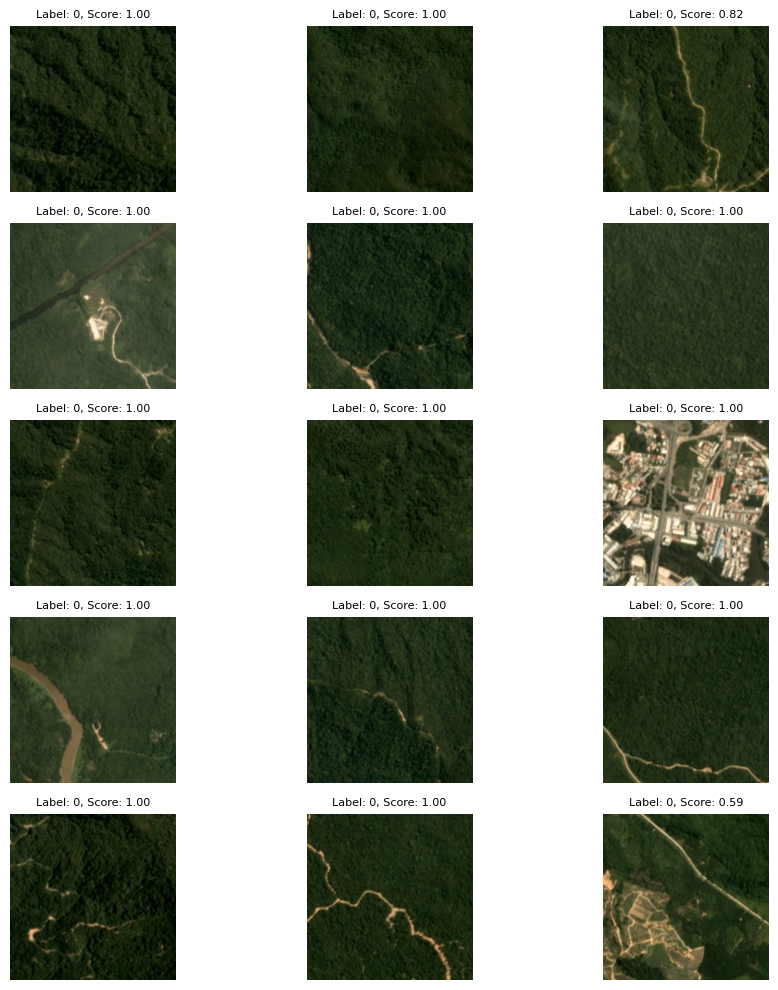

In [ ]:
plot_img_grid(ho_negatives, ho_dir)

In [ ]:
ho_counts = ho['has_oilpalm'].value_counts().to_list()
ho_counts

[1089, 1089]

Text(0.5, 1.0, 'Distribution of has_oilpalm for Holdout Dataset')

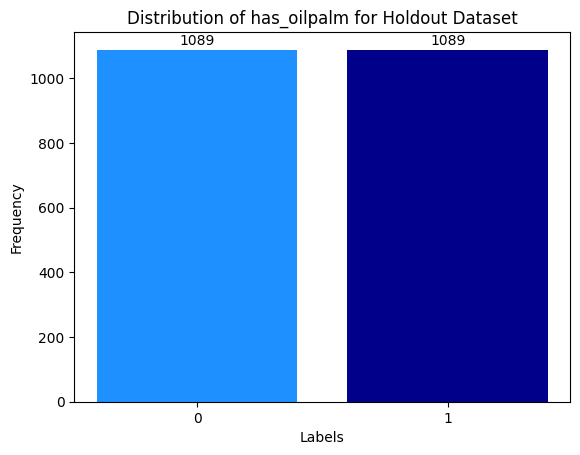

In [ ]:
ho_labels = [0, 1]
plt.bar(ho_labels, ho_counts, color = ['dodgerblue', 'darkblue'])
for i, count in enumerate(ho_counts):
    plt.text(i, count + 15, str(count), ha='center', fontsize=10)
plt.xlabel('Labels')
plt.xticks([0,1])
plt.ylabel('Frequency')
plt.title('Distribution of has_oilpalm for Holdout Dataset')

The holdout dataset is perfectly balanced.

In [ ]:
ho_images = []
ho_labels = []

for _, row in ho.iterrows():
    img_path = os.path.join(ho_dir, row['image_id'])

    # Load image and resize it to (224, 224) for VGG19
    img = image.load_img(img_path, target_size=(224, 224))

    # Convert the image to a numpy array
    img_array = image.img_to_array(img)

    # Add batch dimension (VGG19 expects a batch of images, not just a single image)
    img_array = np.expand_dims(img_array, axis=0)

    # Preprocess the image for VGG19
    img_array = preprocess_input(img_array)

    # Remove the batch dimension (back to a single image, as you need a list of images)
    img_array = img_array[0]

    # Append the preprocessed image and its label
    ho_images.append(img_array)
    ho_labels.append(row['has_oilpalm'])

# Convert to numpy arrays
ho_images_arr = np.array(ho_images)
ho_labels_arr = np.array(ho_labels)

In [ ]:
# Save with gzip compression
with gzip.open('holdout_images_labels.pickle.gz', 'wb') as f:
    pickle.dump((ho_images_arr, ho_labels_arr), f)

In [ ]:
with gzip.open('holdout_images_labels.pickle.gz', 'rb') as f:
    ho_images_arr_loaded, ho_labels_arr_loaded = pickle.load(f)

In [ ]:
(ho_images_arr == ho_images_arr_loaded).sum()

327849984

In [ ]:
# Checking if the original and pickled version for holdout dataset are the same
ho_result = 1
for num in ho_images_arr_loaded.shape:
    ho_result *= num

print(ho_result)

327849984


In [ ]:
ho_labels_arr.shape

(2178,)

In [ ]:
ho_labels_arr_loaded.shape

(2178,)

In [ ]:
(ho_labels_arr == ho_labels_arr_loaded).sum()

2178